In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import harmonypy as hm
import anndata
import os
import scrublet
import seaborn as sns 
import scipy.stats as stats

# new packages 
import muon as mu # multi-modal anndatas
import celltypist # automated label predictions
import scrublet as scr

#sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')

/home/groups/singlecell/smorabito/.conda/envs/scanpy-081124/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# set the project directory 
os.chdir('/home/groups/singlecell/smorabito/analysis/SERPENTINE/')
data_dir = 'data/'
fig_dir = 'figures/'

In [3]:
# load the unprocessed adata object for the Chen et al Tumor fraction 
adata = sc.read_h5ad('{}Chen2024_Tumor.h5ad'.format(data_dir))
adata.shape


(279886, 36027)

## Run Doublet Detection 

In [4]:
# get a list of all the samples in our adata
samples = adata.obs.Ident.unique().to_list()
obs_list = []

# loop through each sample and run Scrublet
for cur_sample in samples:
    print(cur_sample)
    cur_adata = adata[adata.obs.Ident == cur_sample].copy()
    try:  
        scrub = scr.Scrublet(cur_adata.X)
        doublet_scores, predicted_doublets = scrub.scrub_doublets()
    except:
        doublet_scores = 0
        predicted_doublets = False
        
    cur_adata.obs['doublet_score'] = doublet_scores 
    cur_adata.obs['predicted_doublet'] = predicted_doublets
    obs_list.append(cur_adata.obs)

# concatenate the resutls into one table
doublet_df  = pd.concat(obs_list)
doublet_df = doublet_df.set_index('barcode')
adata.obs = adata.obs.set_index('barcode')

# merge with the doublet_df
temp = adata.obs.merge(
    doublet_df,
    on = 'barcode'
)
adata.obs['doublet_score'] = temp['doublet_score']
adata.obs['predicted_doublet'] = temp['predicted_doublet']
adata.obs['predicted_doublet'] = adata.obs['predicted_doublet'].astype("category")

CRC01-T-I
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.54
Detected doublet rate = 0.4%
Estimated detectable doublet fraction = 17.1%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 2.5%
Elapsed time: 0.9 seconds
CRC01-T1-II
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.59
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 28.0%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 0.2%
Elapsed time: 4.3 seconds
CRC01-T2-II
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.61
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 33.8%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 0.1%
Elapsed time: 4.6 seconds


In [19]:
obs_list[1].head()

,orig.ident,nCount_RNA,nFeature_RNA,Ident,Patient,Treatment,Tissue,MajorCellType,SubCellType,Patient ID,...,Tumor Regression Ratio,Response,TRG status,Treatment Regimen,doublet_score,predicted_doublet,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt
barcode,,,,,,,,,,,,,,,,,,,,,
CRC01-T1-II_AAACCTGAGAGTGACC,SeuratProject,1838,621,CRC01-T1-II,P01,II,Tumor,Epi,c84_Coloncyte_CA2,P01,...,0.5648,CR,TRG0,Pembrolizumab,0.015235,False,621,1838.0,402.0,21.871599
CRC01-T1-II_AAACCTGGTAAGAGGA,SeuratProject,4272,1427,CRC01-T1-II,P01,II,Tumor,Epi,c84_Coloncyte_CA2,P01,...,0.5648,CR,TRG0,Pembrolizumab,0.098675,False,1427,4272.0,1265.0,29.611423
CRC01-T1-II_AAACCTGGTTAGTGGG,SeuratProject,2507,1101,CRC01-T1-II,P01,II,Tumor,Epi,c84_Coloncyte_CA2,P01,...,0.5648,CR,TRG0,Pembrolizumab,0.075188,False,1101,2507.0,365.0,14.559235
CRC01-T1-II_AAACCTGTCAGGCAAG,SeuratProject,2108,1064,CRC01-T1-II,P01,II,Tumor,Epi,c90_Epi_MKI67,P01,...,0.5648,CR,TRG0,Pembrolizumab,0.057797,False,1064,2108.0,37.0,1.755218
CRC01-T1-II_AAACCTGTCGAGCCCA,SeuratProject,1777,834,CRC01-T1-II,P01,II,Tumor,Epi,c90_Epi_MKI67,P01,...,0.5648,CR,TRG0,Pembrolizumab,0.069712,False,834,1777.0,180.0,10.129432


## Inspect cell-level quality control (QC) metrics by sample

In [5]:
adata.obs.columns

Index(['orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Ident', 'Patient',
       'Treatment', 'Tissue', 'MajorCellType', 'SubCellType', 'Patient ID',
       'Age', 'Gender', 'Cancer Type', 'Tumor Location', 'TNM', 'Tumor stage',
       'dMMR/pMMR', 'MSI/MSS', 'POLE Mutation', 'TMB (Muts/Mb)',
       'Tumor Regression Ratio', 'Response', 'TRG status', 'Treatment Regimen',
       'doublet_score', 'predicted_doublet'],
      dtype='object')

In [6]:
# compute QC metrics
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

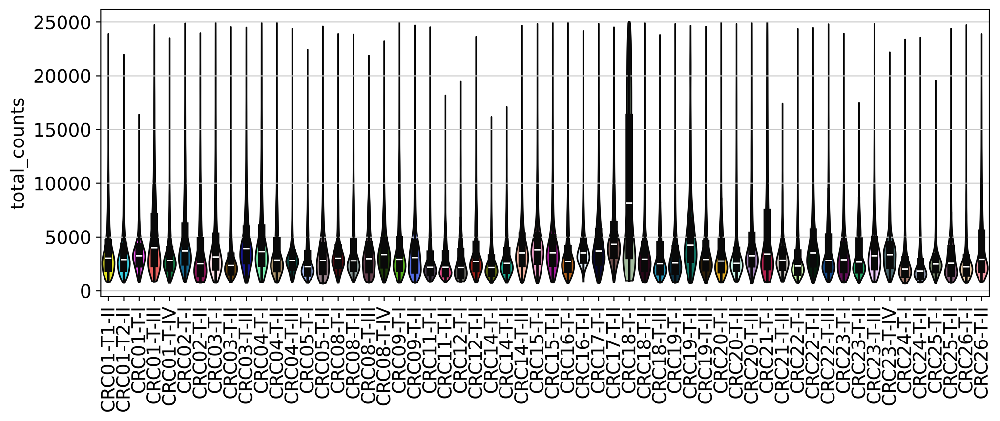

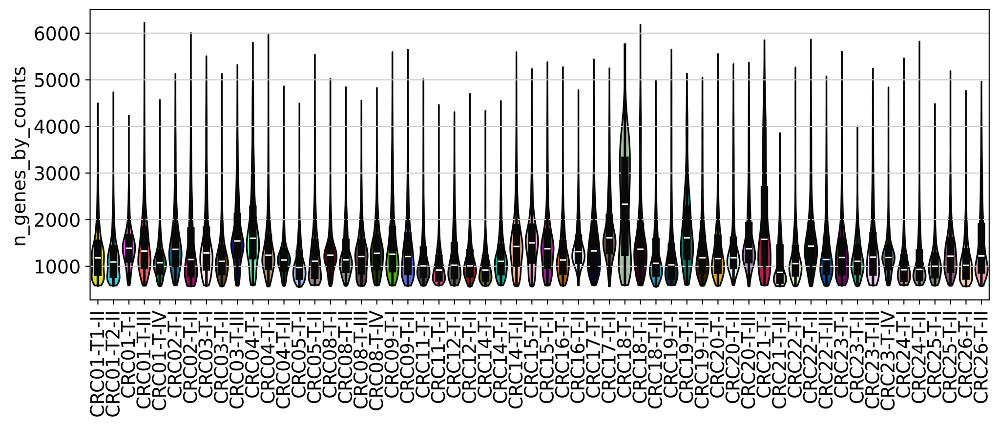

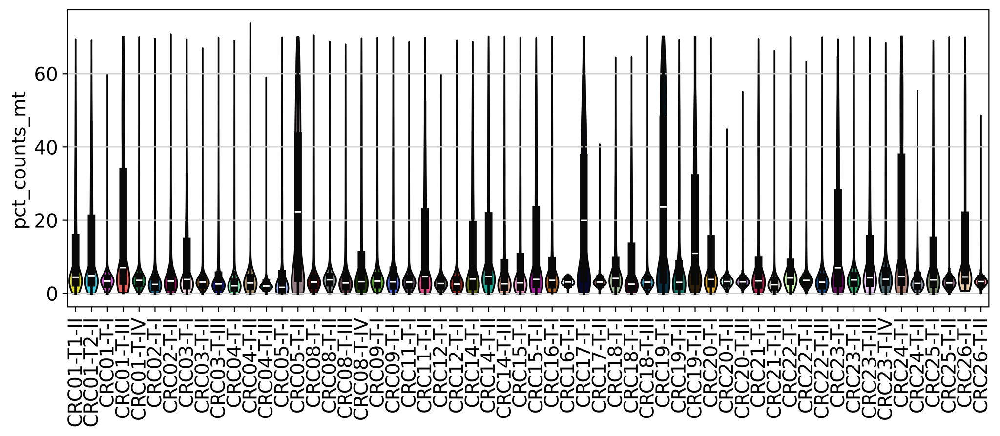

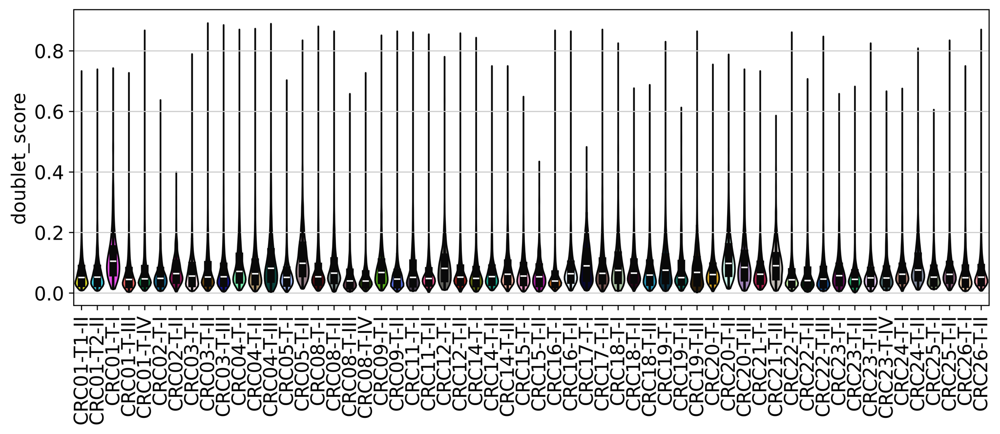

In [7]:
sc.settings.set_figure_params(dpi=400, dpi_save=400, figsize=(10,4), facecolor='white')
sc.pl.violin(adata,[ 'total_counts'], inner='box', size=0,  groupby='Ident', multi_panel=False, rotation=90)
sc.pl.violin(adata,[ 'n_genes_by_counts'], inner='box', size=0,  groupby='Ident', multi_panel=False, rotation=90)
sc.pl.violin(adata,[ 'pct_counts_mt'], inner='box', size=0,  groupby='Ident', multi_panel=False, rotation=90)
sc.pl.violin(adata,[ 'doublet_score'], inner='box', size=0,  groupby='Ident', multi_panel=False, rotation=90)

## Clustering w/ PCA

In [8]:
# save the counts layer
adata.layers['counts'] = adata.X.copy() 

# normalize
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

In [9]:
# identify HVGs
sc.pp.highly_variable_genes(adata)

KeyboardInterrupt: 

In [ ]:
# run PCA
sc.tl.pca(adata)

In [ ]:
# neighbors
sc.pp.neighbors(
    adata, use_rep = 'X_pca', 
    n_neighbors=20, n_pcs=30, metric='cosine'
)

In [ ]:
sc.tl.umap(adata, min_dist=0.35, method='umap')

In [12]:
# clustering 
# sc.tl.leiden(adata, resolution=1)
# sc.tl.dendrogram(adata, 'leiden')

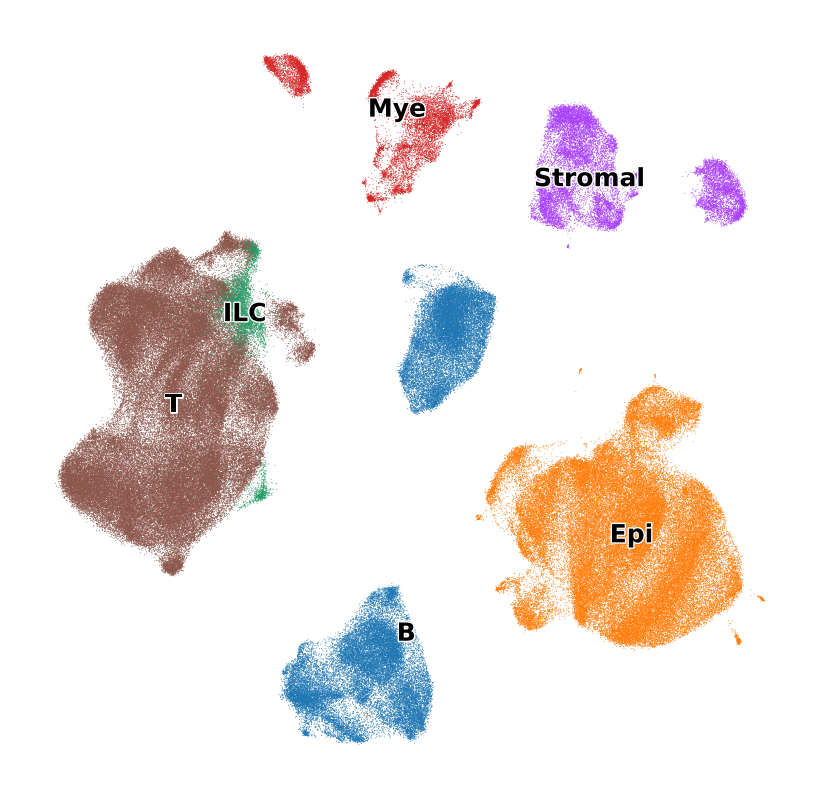

In [13]:
sc.settings.set_figure_params(dpi=100,figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata, 
    color=['MajorCellType'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    title=''
)

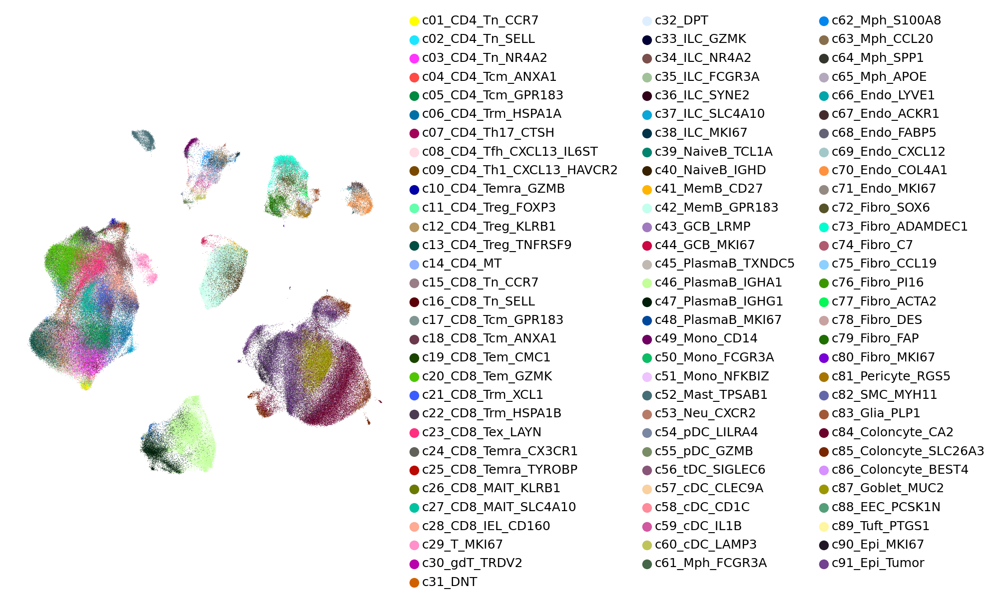

In [14]:
sc.settings.set_figure_params(dpi=100,figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata, 
    color=['SubCellType'],
    frameon=False, 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    title=''
)

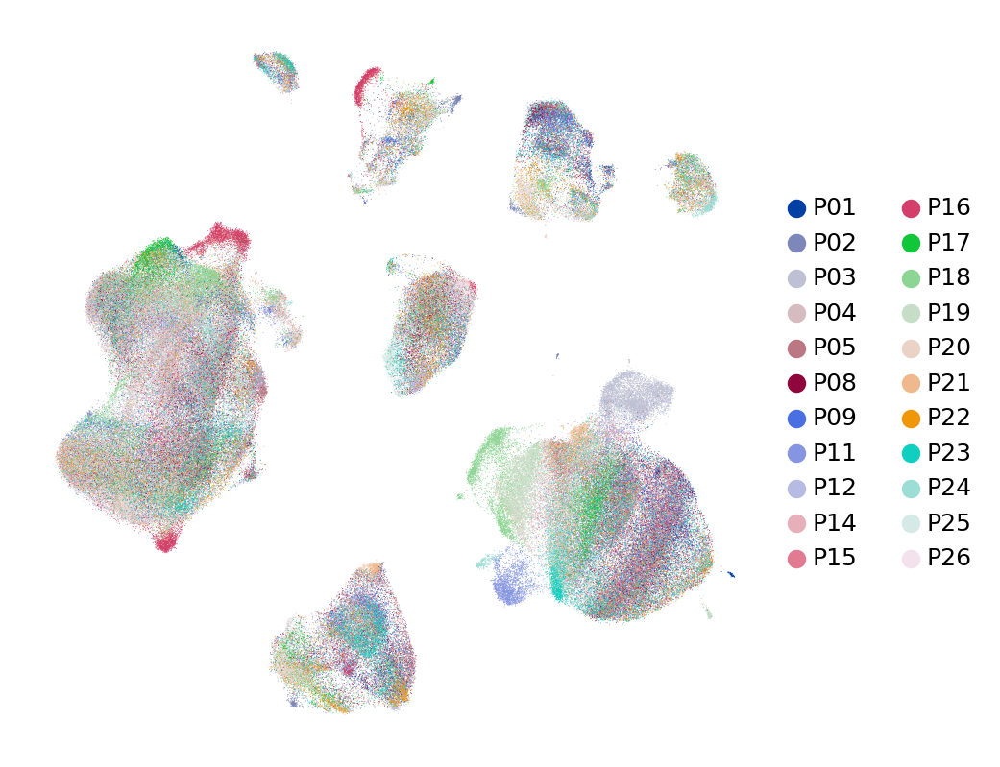

In [15]:
sc.settings.set_figure_params(dpi=100,figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata, 
    color=['Patient'],
    frameon=False, 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    title=''
)

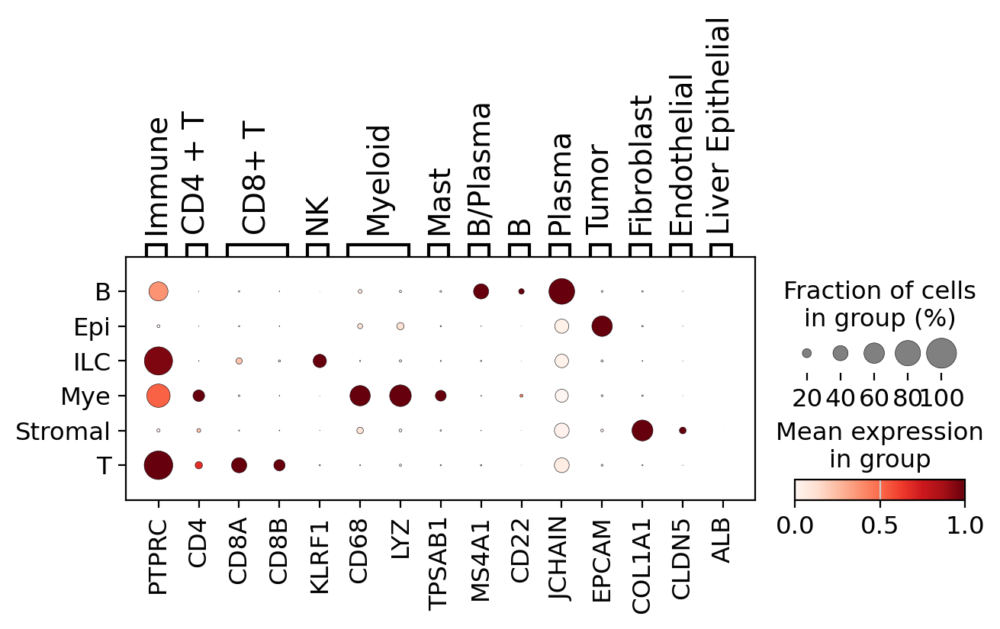

In [16]:

sc.settings.set_figure_params(dpi=100, dpi_save=300, figsize=(15,5), facecolor='white')

marker_dict = {
    'Immune': ['PTPRC'],
    'CD4 + T': ['CD4'],
    'CD8+ T': ['CD8A', 'CD8B'],
    'NK': ['KLRF1'],
    'Myeloid': ['CD68', 'LYZ'],
    'Mast': ['TPSAB1'],
    'B/Plasma': ['MS4A1'],
    'B': ['CD22'],
    'Plasma': ['JCHAIN'],
    'Tumor': ['EPCAM'],
    'Fibroblast': ['COL1A1'],
    'Endothelial': ['CLDN5'],
    'Liver Epithelial': ['ALB']
}



sc.pl.dotplot(
    adata, marker_dict, 'MajorCellType',
    standard_scale='var', swap_axes=False
)

#sc.pl.dotplot(adata, marker_dict, groupby='leiden', figsize=(12,6), standard_scale='var',  dendrogram=True, save='markers.pdf')

In [17]:
len(adata.obs.Ident.unique())

58

## Run CellTypist predictions for 5 models

In [18]:
model_files ={
    'AIFI_L1': '/home/groups/singlecell/smorabito/analysis/SERPENTINE/reference_data/AIFI/data/ref_pbmc_clean_celltypist_model_AIFI_L1_2024-04-18.pkl',
    'AIFI_L2': '/home/groups/singlecell/smorabito/analysis/SERPENTINE/reference_data/AIFI/data/ref_pbmc_clean_celltypist_model_AIFI_L2_2024-04-19.pkl',
    'AIFI_L3': '/home/groups/singlecell/smorabito/analysis/SERPENTINE/reference_data/AIFI/data/ref_pbmc_clean_celltypist_model_AIFI_L3_2024-04-19.pkl',
    'Immune_All_Low': '/home/groups/singlecell/smorabito/analysis/SERPENTINE/reference_data/Conde2022/data/Immune_All_Low.pkl',
    'Immune_All_High': '/home/groups/singlecell/smorabito/analysis/SERPENTINE/reference_data/Conde2022/data/Immune_All_High.pkl'
}

In [19]:
label_results = {}
prob_results = {}
for model_name, model in model_files.items():
    print(model_name)
    label_column = f'{model_name}_prediction'
    score_column = f'{model_name}_score'
    
    predictions = celltypist.annotate(
        filename = adata, 
        model = model
    )
    
    labels = predictions.predicted_labels
    labels = labels.rename({'predicted_labels': label_column}, axis = 1)
    
    prob = predictions.probability_matrix
    labels[score_column] = prob.max(axis='columns').to_list()
    label_results[model_name] = labels

    # add predicted probabilities to the adata.obsm
    adata.obsm[model_name] = prob

AIFI_L1


🔬 Input data has 279886 cells and 36027 genes
🔗 Matching reference genes in the model
🧬 1093 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


AIFI_L2


🔬 Input data has 279886 cells and 36027 genes
🔗 Matching reference genes in the model
🧬 1907 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


AIFI_L3


🔬 Input data has 279886 cells and 36027 genes
🔗 Matching reference genes in the model
🧬 2471 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


Immune_All_Low


🔬 Input data has 279886 cells and 36027 genes
🔗 Matching reference genes in the model
🧬 5895 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


Immune_All_High


🔬 Input data has 279886 cells and 36027 genes
🔗 Matching reference genes in the model
🧬 5895 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


In [20]:
# add the labels & label scores to the obs 
for model_name, label_df in label_results.items():    
    label_column = f'{model_name}_prediction'
    score_column = f'{model_name}_score'

    adata.obs[label_column] = label_df[label_column]
    adata.obs[score_column] = label_df[score_column]

In [21]:
adata.obs.columns

Index(['orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Ident', 'Patient',
       'Treatment', 'Tissue', 'MajorCellType', 'SubCellType', 'barcode',
       'Patient ID', 'Age', 'Gender', 'Cancer Type', 'Tumor Location', 'TNM',
       'Tumor stage', 'dMMR/pMMR', 'MSI/MSS', 'POLE Mutation', 'TMB (Muts/Mb)',
       'Tumor Regression Ratio', 'Response', 'TRG status', 'Treatment Regimen',
       'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt',
       'AIFI_L1_prediction', 'AIFI_L1_score', 'AIFI_L2_prediction',
       'AIFI_L2_score', 'AIFI_L3_prediction', 'AIFI_L3_score',
       'Immune_All_Low_prediction', 'Immune_All_Low_score',
       'Immune_All_High_prediction', 'Immune_All_High_score'],
      dtype='object')

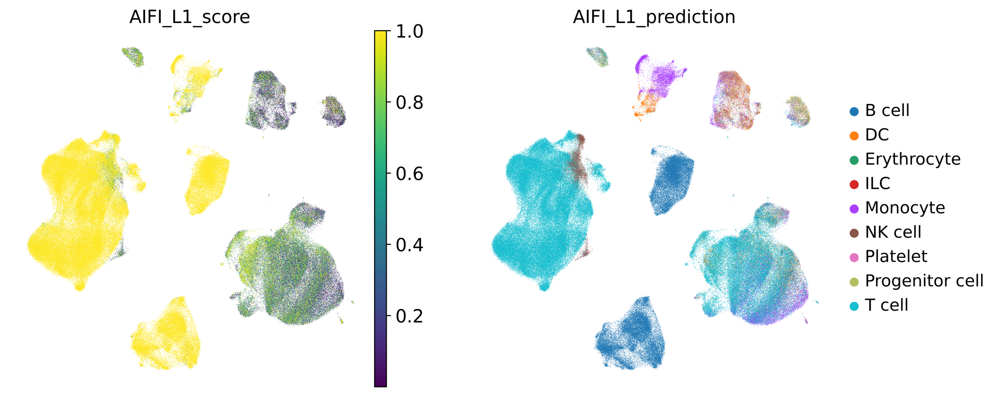

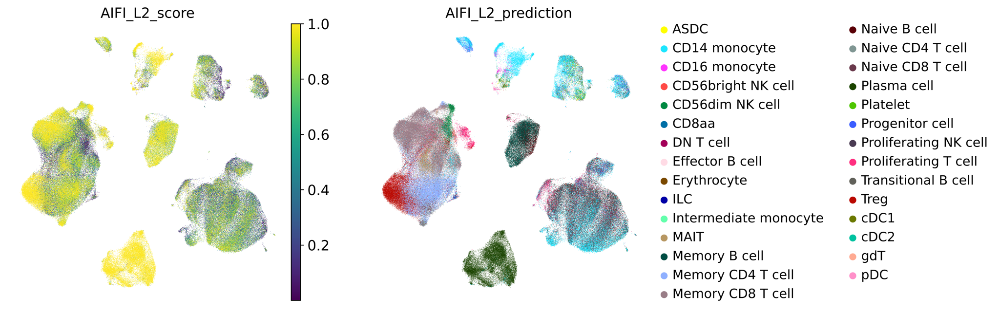

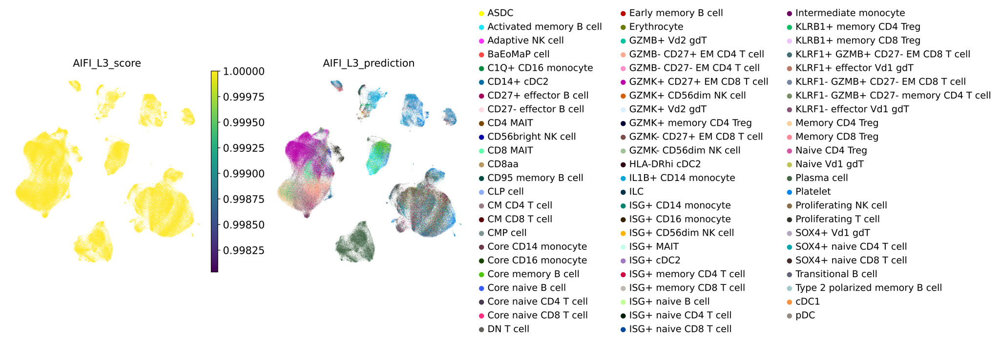

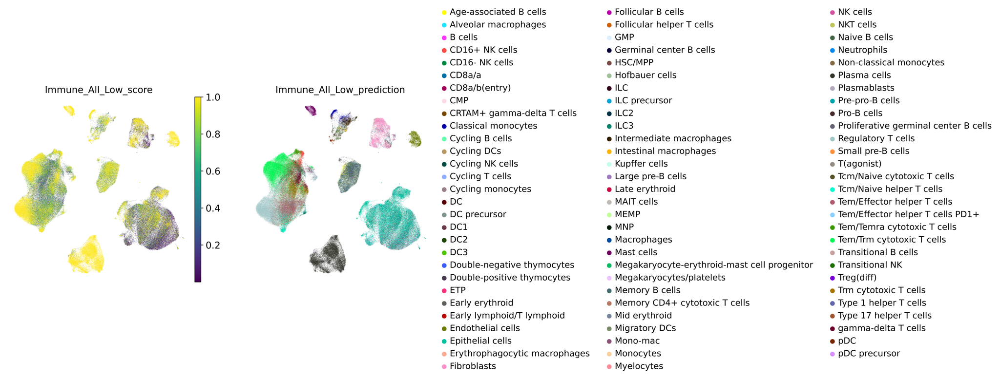

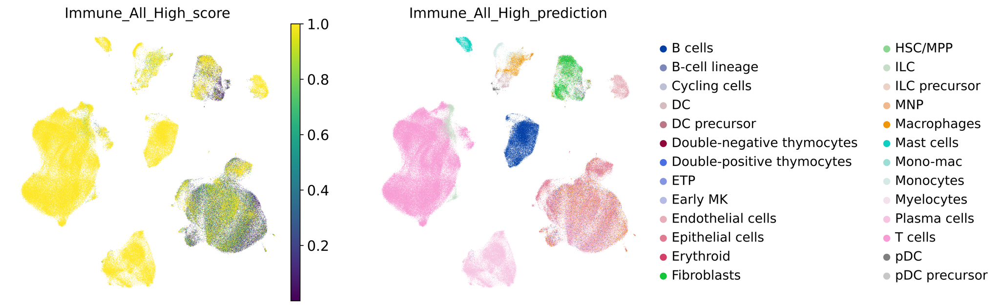

In [22]:
sc.settings.set_figure_params(dpi=400, dpi_save=500, figsize=(5,5), facecolor='white')
for model_name in label_results.keys():    
    label_column = f'{model_name}_prediction'
    score_column = f'{model_name}_score'
    
    sc.pl.umap(
        adata,
        color = [score_column, label_column],
        frameon = False
    )

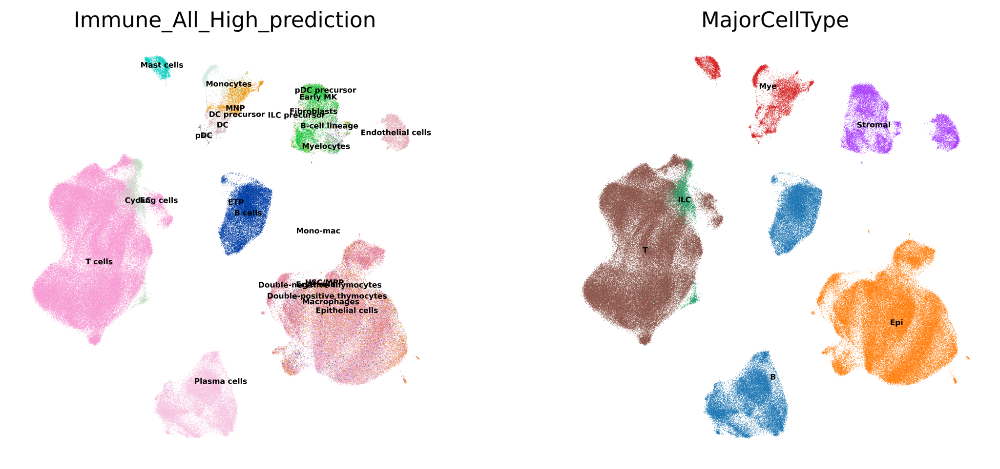

In [23]:
sc.settings.set_figure_params(dpi=400, dpi_save=500, figsize=(5,5), facecolor='white')

sc.pl.umap(
    adata,
    color = ["Immune_All_High_prediction", 'MajorCellType'],
    legend_loc='on data', 
    legend_fontsize=5, 
    frameon = False
)

In [24]:
# save processed anndata:
adata.write('{}Chen2024_Tumor_processed_201124.h5ad'.format(data_dir))

## Majority voting

Here we write a function to reconcile the differences between these CellTypist predicted labels and the results of typical clustering analysis. Essentially, this function will label the entire cluster with the most frequent or most confident label.

* Work with the predicted labels, or work with the confidence scores? Scores are probably better.
* When there is too much of a mix, report that it is a mixed population. Controlled by a parameter mix_thresh.
* What happens when the maximum score is low, below some threshold? Report it as low-confidence, or missing label?

In [25]:
# run leiden clustering:
sc.tl.leiden(adata, resolution=1)

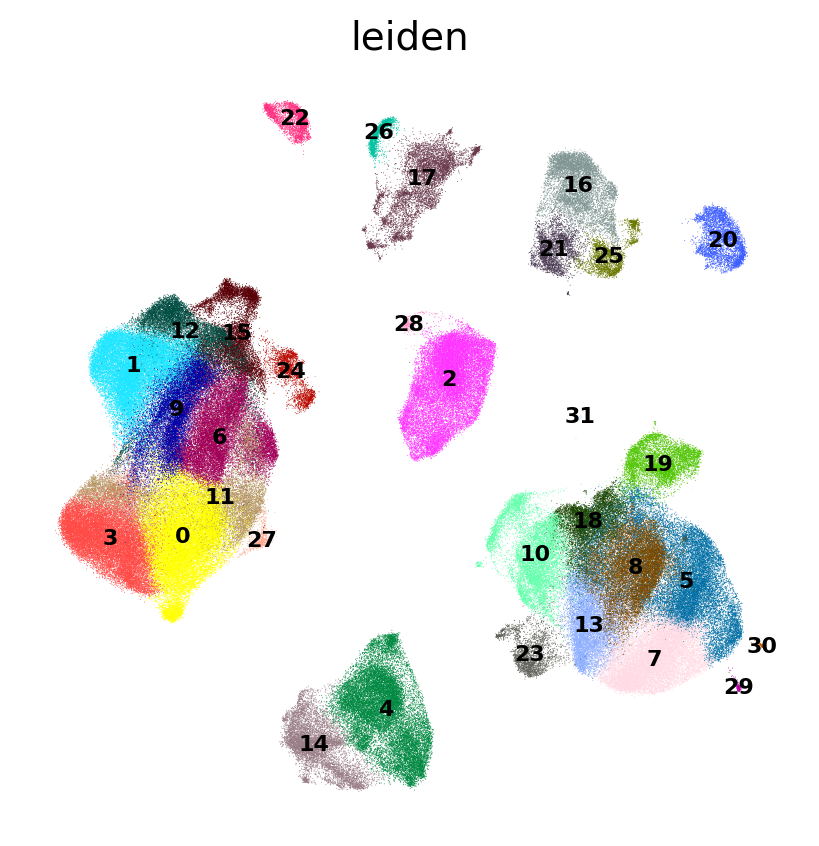

In [26]:
sc.settings.set_figure_params(dpi=100, dpi_save=500, figsize=(5,5), facecolor='white')

sc.pl.umap(
    adata,
    color = ["leiden"],
    legend_loc='on data', 
    legend_fontsize=8, 
    frameon = False
)

In [27]:
# save processed anndata:
adata.write('{}Chen2024_Tumor_processed_201124.h5ad'.format(data_dir))

In [92]:
import seaborn as sns

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


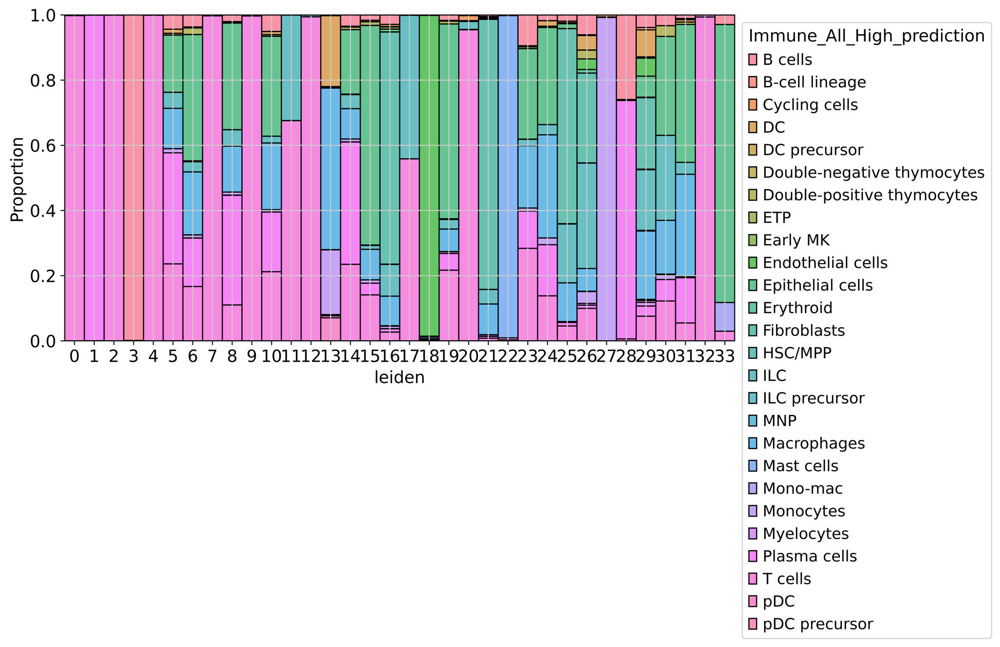

In [93]:
# stacked bar chart
sc.settings.set_figure_params(dpi=400, dpi_save=500, figsize=(10,5), facecolor='white')
ax = sns.histplot(
    data = adata.obs,
    x = 'leiden',
    hue = 'Immune_All_High_prediction',
    multiple='fill', stat='proportion',
    discrete=True
)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

In [90]:

group_by = "leiden"
prediction_name = "Immune_All_High"

cluster_labels = adata.obs[group_by]
clusters = cluster_labels.unique().to_list()
predictions = adata.obsm[prediction_name]

# add a cluster column 
predictions['cluster'] = cluster_labels

# calculate average predictions for each cluster 
avg_predictions = predictions.groupby('cluster').mean()

# get the max avg predicted for each cluster 
max_labels = avg_predictions.max(axis='columns').to_list()
max_scores = avg_predictions.idxmax(axis='columns').to_list()


## How similar are CellTypist results when I subset the data?

Re-run CellTypist models for the T-cell compartment, and then correlate the results.

Conclusion: results are nearly identical, Pearson R between the scores were like 0.9999 or 1. No need to re-run CellTypist for different subsets of the data.


In [100]:
adata_tcell = adata[adata.obs.MajorCellType == 'T'].copy()

In [101]:
label_results = {}
prob_results = {}
for model_name, model in model_files.items():
    print(model_name)
    label_column = f'{model_name}_prediction'
    score_column = f'{model_name}_score'
    
    predictions = celltypist.annotate(
        filename = adata_tcell, 
        model = model
    )
    
    labels = predictions.predicted_labels
    labels = labels.rename({'predicted_labels': label_column}, axis = 1)
    
    prob = predictions.probability_matrix
    labels[score_column] = prob.max(axis='columns').to_list()
    label_results[model_name] = labels

    # add predicted probabilities to the adata.obsm
    adata_tcell.obsm[model_name + '_subset'] = prob

AIFI_L1


👀 Invalid expression matrix in `.X`, expect log1p normalized expression to 10000 counts per cell; will use `.raw.X` instead
🔬 Input data has 118957 cells and 36027 genes
🔗 Matching reference genes in the model
🧬 1093 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


AIFI_L2


👀 Invalid expression matrix in `.X`, expect log1p normalized expression to 10000 counts per cell; will use `.raw.X` instead
🔬 Input data has 118957 cells and 36027 genes
🔗 Matching reference genes in the model
🧬 1907 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


AIFI_L3


👀 Invalid expression matrix in `.X`, expect log1p normalized expression to 10000 counts per cell; will use `.raw.X` instead
🔬 Input data has 118957 cells and 36027 genes
🔗 Matching reference genes in the model
🧬 2471 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


Immune_All_Low


👀 Invalid expression matrix in `.X`, expect log1p normalized expression to 10000 counts per cell; will use `.raw.X` instead
🔬 Input data has 118957 cells and 36027 genes
🔗 Matching reference genes in the model
🧬 5895 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


Immune_All_High


👀 Invalid expression matrix in `.X`, expect log1p normalized expression to 10000 counts per cell; will use `.raw.X` instead
🔬 Input data has 118957 cells and 36027 genes
🔗 Matching reference genes in the model
🧬 5895 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


In [102]:
adata_tcell.obsm

AxisArrays with keys: X_pca, X_umap, Immune_All_High, AIFI_L1, AIFI_L2, AIFI_L3, Immune_All_Low, AIFI_L1_subset, AIFI_L2_subset, AIFI_L3_subset, Immune_All_Low_subset, Immune_All_High_subset

In [103]:
df1 = adata_tcell.obsm['Immune_All_High']
df2 = adata_tcell.obsm['Immune_All_High_subset']

In [107]:
df1.head()

,B cells,B-cell lineage,Cycling cells,DC,DC precursor,Double-negative thymocytes,Double-positive thymocytes,ETP,Early MK,Endothelial cells,...,Mono-mac,Monocyte precursor,Monocytes,Myelocytes,Plasma cells,Promyelocytes,T cells,pDC,pDC precursor,cluster
barcode,,,,,,,,,,,,,,,,,,,,,
CRC01-T-I_AAACCTGGTTGCCTCT,0.001329,0.000031,0.000010,0.000071,0.000012,1.089207e-06,0.000002,0.000003,0.000076,7.239900e-05,...,0.000108,0.000027,0.000019,0.000384,0.000010,0.000010,1.000000,0.000045,0.000077,2
CRC01-T-I_AAACGGGCAATGGAGC,0.000500,0.000313,0.000005,0.000153,0.000006,5.647324e-06,0.000014,0.000037,0.000005,4.022211e-06,...,0.000036,0.000099,0.000159,0.000006,0.000004,0.000106,0.999926,0.000150,0.000023,0
CRC01-T-I_AAACGGGCAGTGAGTG,0.000045,0.002261,0.000007,0.000282,0.000279,1.180793e-05,0.000006,0.000020,0.000015,5.410896e-05,...,0.000023,0.000058,0.000115,0.000021,0.000139,0.000015,1.000000,0.000256,0.000038,2
CRC01-T-I_AAAGATGGTCATACTG,0.000006,0.000009,0.000758,0.000004,0.000064,1.779992e-06,0.000003,0.000025,0.000146,7.297510e-04,...,0.000048,0.000362,0.000017,0.000001,0.000003,0.000017,1.000000,0.000333,0.000027,2
CRC01-T-I_AAAGTAGCATGCATGT,0.000056,0.000005,0.000007,0.000090,0.000132,4.470460e-08,0.000627,0.000006,0.000003,8.853515e-07,...,0.000003,0.000028,0.001077,0.000006,0.000022,0.000009,0.999079,0.000008,0.000012,0


In [117]:
cols = df1.columns.to_list()

cur_group = cols[0]

for cur_group in cols:
    x = stats.pearsonr(x=df1[cur_group].to_list(), y=df2[cur_group].to_list())
    print('cluster: {} , R: {}'.format(cur_group, x))


cluster: B cells , R: PearsonRResult(statistic=0.9999999999999999, pvalue=0.0)
cluster: B-cell lineage , R: PearsonRResult(statistic=0.9999999999999993, pvalue=0.0)
cluster: Cycling cells , R: PearsonRResult(statistic=0.9999999999999998, pvalue=0.0)
cluster: DC , R: PearsonRResult(statistic=1.0, pvalue=0.0)
cluster: DC precursor , R: PearsonRResult(statistic=0.9999999999999999, pvalue=0.0)
cluster: Double-negative thymocytes , R: PearsonRResult(statistic=1.0, pvalue=0.0)
cluster: Double-positive thymocytes , R: PearsonRResult(statistic=1.0, pvalue=0.0)
cluster: ETP , R: PearsonRResult(statistic=1.0, pvalue=0.0)
cluster: Early MK , R: PearsonRResult(statistic=0.9999999999999997, pvalue=0.0)
cluster: Endothelial cells , R: PearsonRResult(statistic=0.9999999999999999, pvalue=0.0)
cluster: Epithelial cells , R: PearsonRResult(statistic=0.9999999999999998, pvalue=0.0)
cluster: Erythrocytes , R: PearsonRResult(statistic=0.9999999999999992, pvalue=0.0)
cluster: Erythroid , R: PearsonRResult(s

KeyError: 'cluster'